<a href="https://colab.research.google.com/github/fwmetzler/colabtemp/blob/master/Time_dependent_Schrodinger.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import sys
import os
import importlib
import glob

import matplotlib.pyplot as plt
from matplotlib import cm
import shutil
import platform
from scipy.optimize import curve_fit
from scipy.signal import find_peaks

from matplotlib import animation, rc

In [2]:
# Beating in a double well potential
# A double well potential is defined. The initial condition concentrates the
# wavefunction around one of the minima. The simulation shows that, periodically, the
# energy tunnels between the two wells.

Nx = 3000						# Grid points
Ny = Nx
dt = 0.01					# Evolution step
xmax = 60					# x-window size
ymax = xmax					# y-window size
absorb_coeff = 20		# 0 = periodic boundary

In [3]:
increments_between_frames = 40 # how many iterations need to be calculated between shown images

In [4]:
animation_frame_interval = 20
number_of_frames = 500
tmax = dt * number_of_frames * animation_frame_interval #total length of the simulation

In [5]:
def grid(Nx,Ny,xmax,ymax):
	x = np.linspace(-xmax, xmax-2*xmax/Nx, Nx)     # x variable
	y = 0                 # not used, but a value must be given
	return x,y;

# Builds the Laplacian in Fourier space

def Lfnc(Nx,Ny,xmax,ymax):
	kx = np.linspace(-Nx/4/xmax, Nx/4/xmax-1/2/xmax, Nx)     # x variable
	return (2*np.pi*1.j*kx)**2 

# Introduces an absorbing shell at the border of the computational window

def absorb(x,y,xmax,ymax,dt,absorb_coeff):
	wx = xmax/20
	return np.exp(-absorb_coeff*(2-np.tanh((x+xmax)/wx)+np.tanh((x-xmax)/wx))*dt);

# Saves the data of abs(psi)**2 at different values of t

def savepsifnc(Ny,psi):
	
	return abs(psi)**2   		    

In [6]:
def psi_0(x,y):				# Initial wavefunction

	f = 0.j+np.exp(-((x-1)**2)/2)   # A Gaussian centered at one of the wells

	return f;

In [7]:
# Initialization of the computation

def init_values():
  
  global x,y,psi,L,linear_phase,border

  x, y = grid(Nx,Ny,xmax,ymax)		# builds spatial grid
  psi = psi_0(x,y) 					# loads initial condition

  L = Lfnc(Nx,Ny,xmax,ymax)		# Laplacian in Fourier space
  linear_phase = np.fft.fftshift(np.exp(1.j*L*dt/2))            	# linear phase in Fourier space (including point swap)
  border = absorb(x,y,xmax,ymax,dt,absorb_coeff)    # Absorbing shell at the border of the computational window

init_values()  

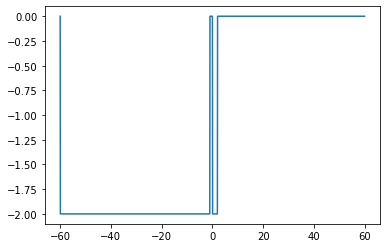

In [8]:
def Vfnc1(x,y,t,psi):		# A double well potential

	b_min=-60
	b_max=-1
	l_2= (b_max - b_min)/2  #half of the width of the left well
	center=(b_max + b_min)/2
	V = np.piecewise(x, [abs(x-1)<1, abs(x-1)>=1],[-2,0]) + np.piecewise(x, [abs(x-center)<l_2, abs(x-center)>=l_2],[-2,0]) #V equal
	return V;

Vname = "Vfnc1"
V = globals()[Vname](x,y,dt,psi)
plt.plot(x,V)

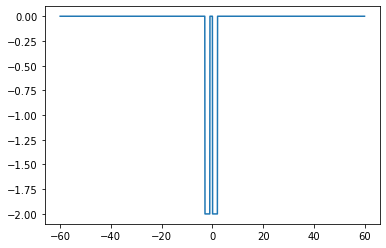

In [9]:
def Vfnc2(x,y,t,psi):		# A double well potential

	V = np.piecewise(x, [abs(x-1)<1, abs(x-1)>=1],[-2,0]) + np.piecewise(x, [abs(x+2)<1, abs(x+2)>=1],[-2,0])
	return V;

Vname = "Vfnc2"
V = globals()[Vname](x,y,dt,psi)
plt.plot(x,V)    

In [10]:
#setting up the empty plot 

def init_figure():
  
  global fig,ax,psi_x_line,V_x_line

  fig, ax = plt.subplots()
  plt.xlabel('$x$')           # format LaTeX if installed (choose axes labels, 
  plt.ylabel('$|\psi|^2$')    # title of the plot and axes range
  #plt.title('$t=$ %f'%(t))    # title of the plot
  plt.close()

  ax.set_xlim((min(x),max(x)))
  ax.set_ylim((-2, 2))

  psi_x_line, = ax.plot([], [], lw=2)
  V_x_line, = ax.plot([], [], lw=2)

#def init():
#    psi_x_line.set_data([], [])
#    V_x_line.set_data([], [])
#    return (psi_x_line, V_x_line)

In [11]:
# defining animation function which contains the stepwise calculation 

def animate(k,Vname): # k counts the frame number we are on
	
	global psi,x,y,all_psi

	for i in range(increments_between_frames): # before moving on to the next frame, we caclulate that many intermediate steps of the small dt increment
		j = (k*increments_between_frames)+i # the global counting variable j is the product of the frame we are on and the increments per frame 
		# i.e. the total number of increments dt processed so far
		
		V = globals()[Vname](x,y,j*dt,psi)			# potential operator
		psi *= np.exp(-1.j*dt*V)			# potential phase
		psi = np.fft.fft(psi)			# 1D Fourier transform
		psi *=linear_phase		        # linear phase from the Laplacian term
		psi = border*np.fft.ifft(psi)	# inverse Fourier transform and damping by the absorbing shel
		
	print(".", end="", flush=True)
	psi_x_line.set_data(x, abs(psi)**2)
	V_x_line.set_data(x,V) # the last read value of V 

	all_psi.append(psi)

In [12]:
# call the animator
init_values()
init_figure()

all_psi = list()

Vname = "Vfnc1"
anim = animation.FuncAnimation(fig, animate, fargs=[Vname], #init_func=init,
                               frames=number_of_frames, interval=animation_frame_interval, blit=False) #
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [13]:
all_psi1=all_psi   # save separately the psi of the first computation

In [14]:
# call the animator
init_values()
init_figure()

all_psi = list()   #reinitialize the list that will contain tthe new psi

Vname = "Vfnc2"
anim = animation.FuncAnimation(fig, animate, fargs=[Vname], #init_func=init,
                               frames=number_of_frames, interval=animation_frame_interval, blit=False) #
# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
anim

.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

In [17]:
all_psi2=all_psi    # save separately the psi of the second computation
all_psi1sq =  [abs(ele)**2 for ele in all_psi1]  
all_psi2sq =  [abs(ele)**2 for ele in all_psi2]

idx_pos=np.where(x>-1)
prob1 = [np.sum(ele[idx_pos]) for ele in all_psi1sq]   #probability of being in the well on the right
prob1 = prob1 / max(prob1) 
dt_frame = animation_frame_interval * dt                 #time between each frame
tt = np.arange(0,len(prob1)) * dt_frame
prob2 = [np.sum(ele[idx_pos]) for ele in all_psi2sq]   #probability of being in the well on the right
prob2 = prob2 / max(prob2) 
dt_frame = animation_frame_interval * dt                 #time between each frame
tt = np.arange(0,len(prob2)) * dt_frame


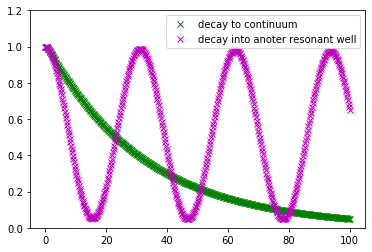

In [18]:
#we should put a 3D plot that illustrates that these curves are the probability of the particle
#to be found in the right well
plt.figure()
plt.plot(tt,prob1, 'gx', label='decay to continuum')
plt.plot(tt,prob2,'mx', label='decay into anoter resonant well')
axes = plt.gca()
axes.set_ylim([0,1.2])
plt.legend()
plt.show()


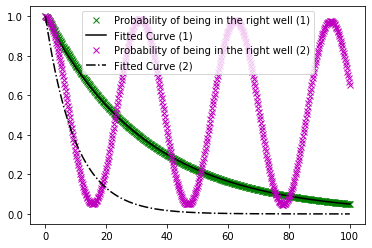

Deacay modeled by:  P =  e^(-gamma * t)
Effective gamma 1 =  [0.03002704]
Effective gamma 2 =  [0.10171897]


In [19]:
#fit with exponetial only the initial interval
def expo(t, gamma):
    return np.exp(-gamma * t)   #most basic decresing exponential (Eq. 8.51 of Peter's Book)
#to cut the prob1-prob2 just before the first minimum
def lim_1st(prob):
    peaks, _ = find_peaks(-prob)
    if len(peaks) == 0 :
        return len(prob)-1
    if len(peaks) != 0 :
        return min(peaks)
    
lim_1st_decay1=lim_1st(prob1)
lim_1st_decay2=lim_1st(prob2)
popt1, pcov1 = curve_fit(expo, tt[0:lim_1st_decay1], prob1[0:lim_1st_decay1])
popt2, pcov2 = curve_fit(expo, tt[0:lim_1st_decay2], prob2[0:lim_1st_decay2])

plt.figure()
plt.plot(tt, prob1,'gx', label="Probability of being in the right well (1)")
plt.plot(tt, expo(tt, *popt1), 'k-', label="Fitted Curve (1)")
plt.plot(tt, prob2,'mx', label="Probability of being in the right well (2)")
plt.plot(tt, expo(tt, *popt2), 'k-.', label="Fitted Curve (2)")
plt.legend()
plt.show()

print('Deacay modeled by:  P =  e^(-gamma * t)')
print('Effective gamma 1 = ', popt1)
print('Effective gamma 2 = ', popt2)